# Упраженение 1

In [1]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
%pip install -q ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.4.54 🚀 Python-3.10.18 torch-2.12.0 CPU (Apple M4 Pro)
Setup complete ✅ (14 CPUs, 24.0 GB RAM, 613.3/926.4 GB disk)


In [3]:
from ultralytics import YOLO
from PIL import Image

model = YOLO('yolo11n.pt')

In [11]:
data_dir = 'data/ex1'
results = []
for i in range(1, 11):
    img = Image.open(f'{data_dir}/{i}.jpg')
    results += model(img, conf=0.8, save=True)


0: 448x640 3 persons, 30.1ms
Speed: 2.0ms preprocess, 30.1ms inference, 0.7ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /opt/homebrew/runs/detect/predict

0: 448x640 4 persons, 27.9ms
Speed: 1.0ms preprocess, 27.9ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /opt/homebrew/runs/detect/predict

0: 448x640 2 persons, 1 dog, 24.1ms
Speed: 1.1ms preprocess, 24.1ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /opt/homebrew/runs/detect/predict

0: 448x640 6 persons, 26.0ms
Speed: 1.1ms preprocess, 26.0ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /opt/homebrew/runs/detect/predict

0: 416x640 4 persons, 22.7ms
Speed: 1.3ms preprocess, 22.7ms inference, 0.3ms postprocess per image at shape (1, 3, 416, 640)
Results saved to /opt/homebrew/runs/detect/predict

0: 384x640 5 persons, 21.7ms
Speed: 0.8ms preprocess, 21.7ms inference, 0.4ms postprocess per image at

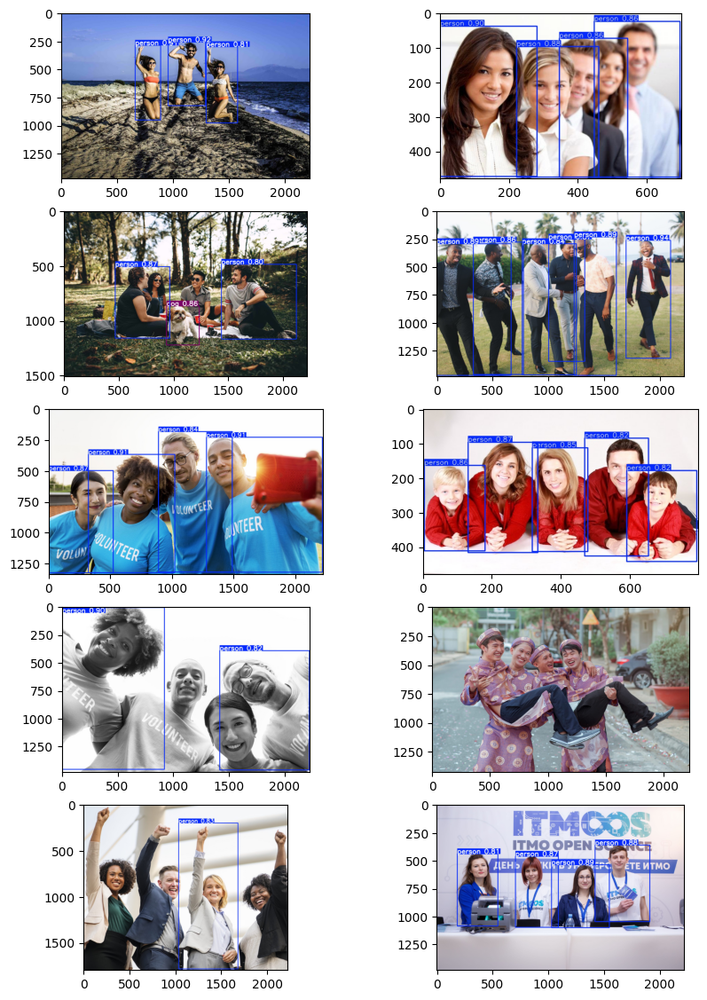

In [14]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(5, 2, figsize=(10, 14))
axs = axs.flatten()

for i in range(1, 11):
    img = Image.open(f"/opt/homebrew/runs/detect/predict/{i}.jpg")
    axs[i-1].imshow(img)

plt.show()

In [15]:
tp = 3+4+2+6+4+5+2+0+1+4
fp = 0+0+0+0+0+0+0+0+0+0
fn = 0+1+2+0+0+0+2+4+3+0
tp, fn

(31, 12)

In [17]:
pr = tp / (tp + fp)
rec = tp / (tp + fn)
f1 = 2 * pr * rec / (pr + rec)
pr, rec, f1

(1.0, 0.7209302325581395, 0.8378378378378378)

# Упражнение 2

## 2.1

In [4]:
import cv2

img_path = "data/ex2/test-img2.jpg"

img = cv2.imread(img_path)
img.shape

(1080, 1920, 3)

In [6]:
row, col = 509, 980

img[row, col]

array([153, 176, 255], dtype=uint8)

## 2.2

In [8]:
img_path = "data/ex2/nicolas-reymond-tNm6DL_nO-o-unsplash.jpg"

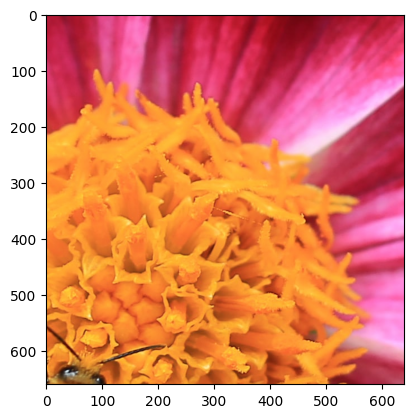

In [10]:
img = cv2.imread(img_path)

crop = img[1630:2290, 2580:3220]
plt.imshow(crop[:, :, ::-1])

## 2.3

1.5
546


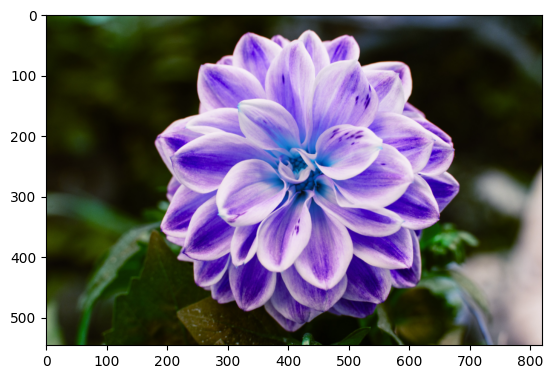

In [29]:
img_path = "data/ex2/markus-winkler-wvii1ayGs3A-unsplash.jpg"

img = cv2.imread(img_path)

target_width = 820
target_height = int(target_width / img.shape[1] * img.shape[0])
print(img.shape[1] / img.shape[0])
print(target_height)

res = cv2.resize(img, (target_width, target_height), interpolation = cv2.INTER_AREA)
#res = cv2.cvtColor(res, cv2.COLOR_BGR2RGB)
plt.imshow(res)

In [30]:
cv2.imwrite("blabla.jpg", res)
!ls -l blabla.jpg

-rw-r--r--  1 joulin  staff  133004 May 25 21:55 blabla.jpg


In [24]:
os.path.getsize('blabla.jpg')

41638

# Упражнение 3

## 3.1

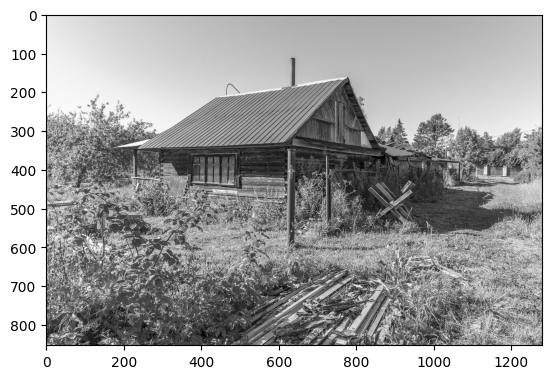

In [44]:
img_path = "data/ex3/village-5511732_1280.jpg"

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img, 'gray')

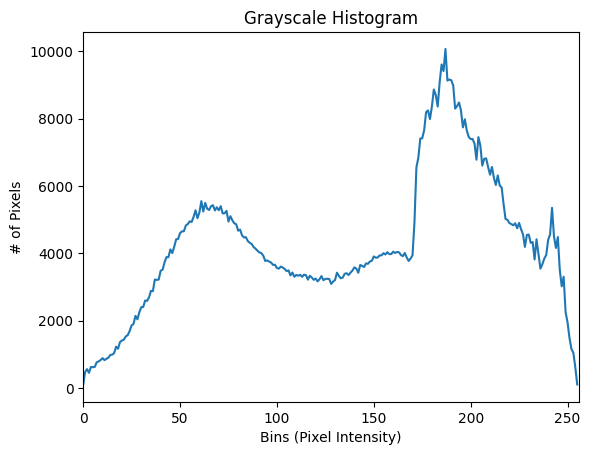

In [46]:
# Calculate histogram
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

# Plot histogram
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("Bins (Pixel Intensity)")
plt.ylabel("# of Pixels")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()

In [47]:
import numpy as np
np.max(hist), np.argmax(hist)

(np.float32(10073.0), np.int64(187))

In [38]:
hist.shape

(256, 1)

## 3.2

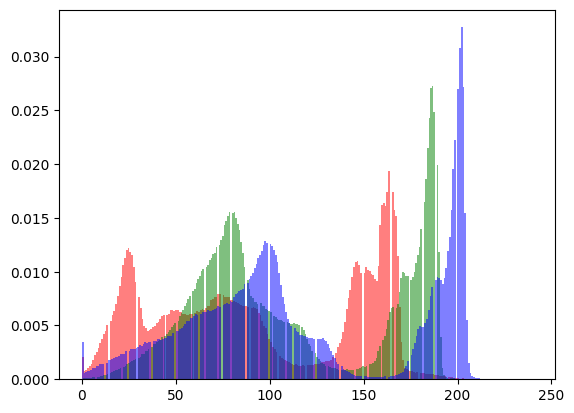

In [9]:
img_path = "data/ex3/saint-petersbourg-1936035_1280.jpg"

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

hist_r = plt.hist(img[:, :, 0].ravel(), bins = 256, color = 'Red', alpha = 0.5, density=True)
hist_g = plt.hist(img[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5, density=True)
hist_b = plt.hist(img[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5, density=True)

plt.show()

In [12]:
print("Max density:", round(max(hist_r[0].max(), hist_g[0].max(), hist_b[0].max()), 4))

Max density: 0.0327


## 3.3

In [67]:
img_path = "data/ex3/russia-1927758_1280.jpg"

img = cv2.imread(img_path)

Значение интенсивности канала R: 33
Значение интенсивности канала G: 115
Значение интенсивности канала B: 137


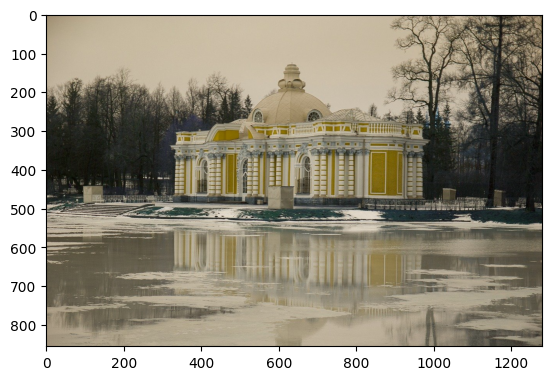

In [71]:
import cv2
import numpy as np

def linear_normalize_channel(channel):
    """Линейная нормировка канала на диапазон [0, 255]"""
    min_val = np.min(channel)
    max_val = np.max(channel)
    if max_val == min_val:
        # Если канал постоянный, устанавливаем все значения в 0 (или 128)
        return np.zeros_like(channel, dtype=np.uint8)
    # Нормализация и приведение к uint8
    normalized = (channel - min_val) * (255.0 / (max_val - min_val))
    return normalized.astype(np.uint8)

# OpenCV загружает в BGR, разделим на каналы
b, g, r = cv2.split(img)

# 2. Линейная нормировка каждого канала на [0, 255]
r_norm = linear_normalize_channel(r)
g_norm = linear_normalize_channel(g)
b_norm = linear_normalize_channel(b)

# Собираем обратно нормированное изображение (BGR)
img_norm = cv2.merge([b_norm, g_norm, r_norm])

# 3. Определяем интенсивности для пикселя (строка 436, столбец 625)
#    В матричном представлении обычно нумерация с 1, в Python с 0,
#    поэтому используем индексы row=435, col=624
row = 436  # 436-я строка
col = 625  # 625-й столбец

# Проверяем, что изображение достаточно большое
height, width = img_norm.shape[:2]
if row >= height or col >= width:
    print(f"Ошибка: изображение имеет размер {width}x{height}, "
          f"а запрошен пиксель ({row+1}, {col+1})")

# Получаем значения пикселя (в BGR порядке)
b_val, g_val, r_val = img_norm[row, col]

# Выводим результаты
print(f"Значение интенсивности канала R: {r_val}")
print(f"Значение интенсивности канала G: {g_val}")
print(f"Значение интенсивности канала B: {b_val}")

# Опционально: покажем исходное и нормированное изображение
plt.imshow(img)

In [73]:
img_path = "data/ex3/blur_monastery-3714287_1280.jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

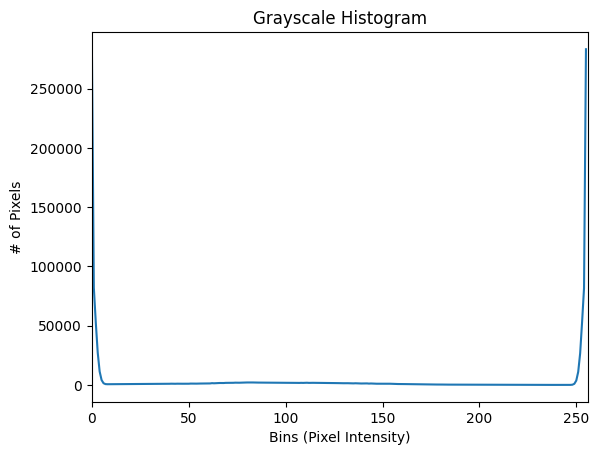

In [86]:
hist = cv2.calcHist([img], [0], None, [256], [0, 256])
# Plot histogram
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("Bins (Pixel Intensity)")
plt.ylabel("# of Pixels")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()

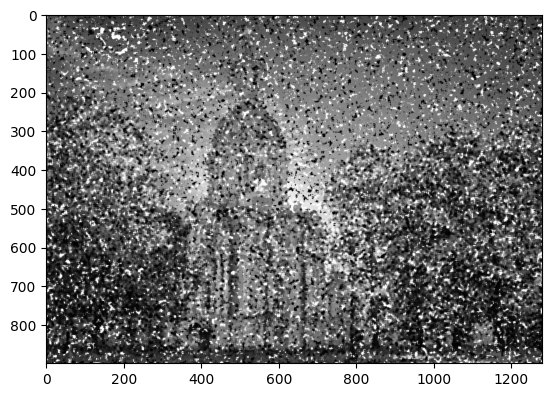

In [85]:
plt.imshow(cv2.medianBlur(img, 7), 'gray')

# Упражнение 4

In [93]:
image_path = "data/ex3/alcedo-atthis-881594_1280.jpg"

# 1. Загружаем изображение в градациях серого
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
if img is None:
    print(f"Не удалось загрузить изображение: {image_path}")
    raise

h, w = img.shape
print(f"Размер изображения: {w} x {h}")

# 2. Дискретное преобразование Фурье
# Выполняем БПФ и сдвигаем нулевую частоту в центр для удобства
f = np.fft.fft2(img)                 # комплексный спектр

# Координаты заданного элемента (строки и столбцы в условии даны с единицы)
row_dft = 278   # 278-я строка -> индекс 277
col_dft = 965   # 965-й столбец -> индекс 964

if row_dft >= h or col_dft >= w:
    print(f"Ошибка: изображение слишком мало для точки ({row_dft+1}, {col_dft+1})")
    raise

# Значение комплексной компоненты
z = f[row_dft, col_dft]
real = z.real
imag = z.imag
print(f"\nКомпонента DFT на пересечении {row_dft+1} строки и {col_dft+1} столбца:")
print(f"Действительная часть: {real:.2f}")
print(f"Мнимая часть: {imag:.2f}")

fshift = np.fft.fftshift(f)          # нулевая частота в центре

# 3. Переместили нулевую частоту в центр уже сделано (fshift)
# Вычисляем амплитуды (модули)
amplitude = np.abs(fshift)
min_amp = np.min(amplitude)
max_amp = np.max(amplitude)
print(f"\nМинимальная амплитуда: {min_amp:.2f}")
print(f"Максимальная амплитуда: {max_amp:.2f}")

# 4. Логарифмическое шкалирование
log_amp = np.log1p(amplitude)   # ln(1 + amplitude)
diff_log = np.max(log_amp) - np.min(log_amp)
print(f"\nРазность max - min после логарифмического шкалирования: {diff_log:.2f}")

# 5. Зануление области низких частот (80×80 в центре)
cy, cx = h // 2, w // 2          # целочисленный центр
half_size = 40                   # половина от 80
y_start = cy - half_size
y_end   = cy + half_size
x_start = cx - half_size
x_end   = cx + half_size

# Копируем спектр (комплексный) и обнуляем центральную область
fshift_filtered = fshift.copy()
fshift_filtered[y_start:y_end, x_start:x_end] = 0

# Обратное преобразование: сдвигаем обратно и выполняем iFFT
f_filtered = np.fft.ifftshift(fshift_filtered)
img_filtered = np.fft.ifft2(f_filtered)   # комплексное изображение

# Координаты для вывода амплитуды обратного преобразования
row_back = 669   # 669-я строка -> индекс 668
col_back = 397   # 397-й столбец -> индекс 396

if row_back >= h or col_back >= w:
    print(f"Ошибка: изображение слишком мало для точки ({row_back+1}, {col_back+1})")
    raise

# Амплитуда (модуль) восстановленного значения
amp_back = np.abs(img_filtered[row_back, col_back])
print(f"\nАмплитуда обратного преобразования на пересечении {row_back+1} строки и {col_back+1} столбца: {amp_back:.2f}")

Размер изображения: 1280 x 720

Компонента DFT на пересечении 279 строки и 966 столбца:
Действительная часть: -10788.80
Мнимая часть: -7447.70

Минимальная амплитуда: 9.43
Максимальная амплитуда: 155667345.00

Разность max - min после логарифмического шкалирования: 16.52

Амплитуда обратного преобразования на пересечении 670 строки и 398 столбца: 4.24


In [112]:
image_path = "data/ex3/bird-2847799_1280.jpg"

img = cv2.imread(image_path)
if img is None:
    print(f"Ошибка: не удалось загрузить изображение {image_path}")

# 2. Оператор Лапласа (для каждого канала отдельно)
# Используем CV_64F для сохранения отрицательных значений, затем берём модуль
laplacian_b = cv2.Laplacian(img[:, :, 0], -1)
laplacian_g = cv2.Laplacian(img[:, :, 1], -1)
laplacian_r = cv2.Laplacian(img[:, :, 2], -1)

laplacian_b = np.abs(laplacian_b)
laplacian_g = np.abs(laplacian_g)
laplacian_r = np.abs(laplacian_r)

# Сумма интенсивностей всех пикселей по трём каналам
sum_laplace = np.sum(laplacian_b) + np.sum(laplacian_g) + np.sum(laplacian_r)
print(f"Сумма интенсивностей после оператора Лапласа: {sum_laplace:.2f}")

# 3. Детектор краёв Канни (требуется изображение в градациях серого)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 200, 3)   # бинарное изображение (0 или 255)

# Сумма интенсивностей всех пикселей полученного изображения
sum_canny = np.sum(edges)
print(f"Сумма интенсивностей после детектора Канни: {sum_canny:.2f}")

Сумма интенсивностей после оператора Лапласа: 12529133.00
Сумма интенсивностей после детектора Канни: 8055960.00


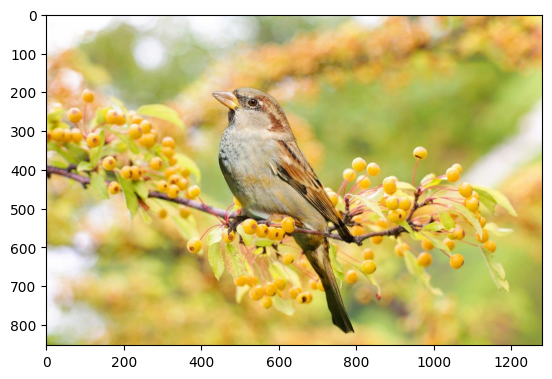

In [21]:
plt.imshow(img[:,:,::-1])

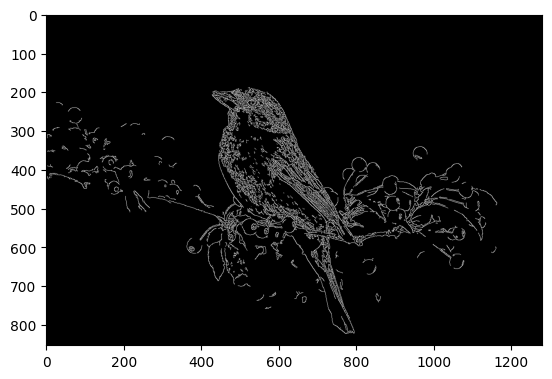

In [20]:
plt.imshow(edges, 'gray')

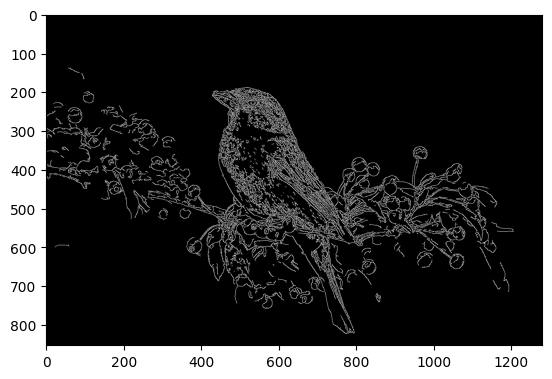

In [18]:
edges = cv2.Canny(img, 100, 200)

# Сумма интенсивностей всех пикселей полученного изображения
sum_canny = np.sum(edges)
print(f"Сумма интенсивностей после детектора Канни: {sum_canny:.2f}")
plt.imshow(edges, 'gray')

# Упражнение 5

In [113]:
%pip install PyWavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 10.8 MB/s  0:00:00m0:00:0100:01

[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: /opt/homebrew/opt/python@3.10/bin/python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [114]:
import cv2
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib as mpl

import pywt
import pywt.data
import numpy as np
from math import sqrt
from PIL import Image, ImageChops, ImageOps
import pickle

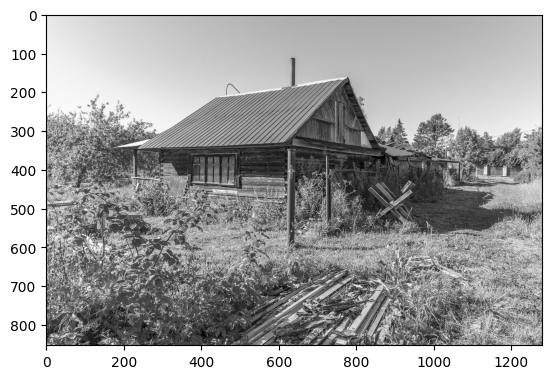

In [115]:
img_path = "data/ex5/village-5511732_1280.jpg"

img = cv2.imread(img_path)
image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(image, cmap='gray');

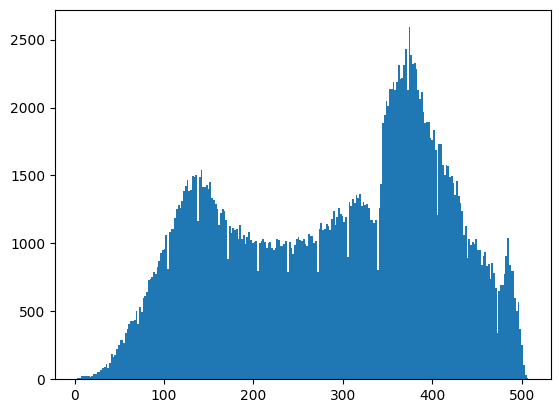

In [116]:
wavelet = 'haar'
c = pywt.dwt2(image,wavelet)
cA, (cH, cV, cD) = c

gray_hist = plt.hist(cA.ravel(), bins = 256)

In [119]:
np.max(gray_hist[0])

np.float64(2591.0)

In [124]:
np.min(cH), np.max(cH)

(np.float64(-225.50000000000003), np.float64(213.00000000000006))

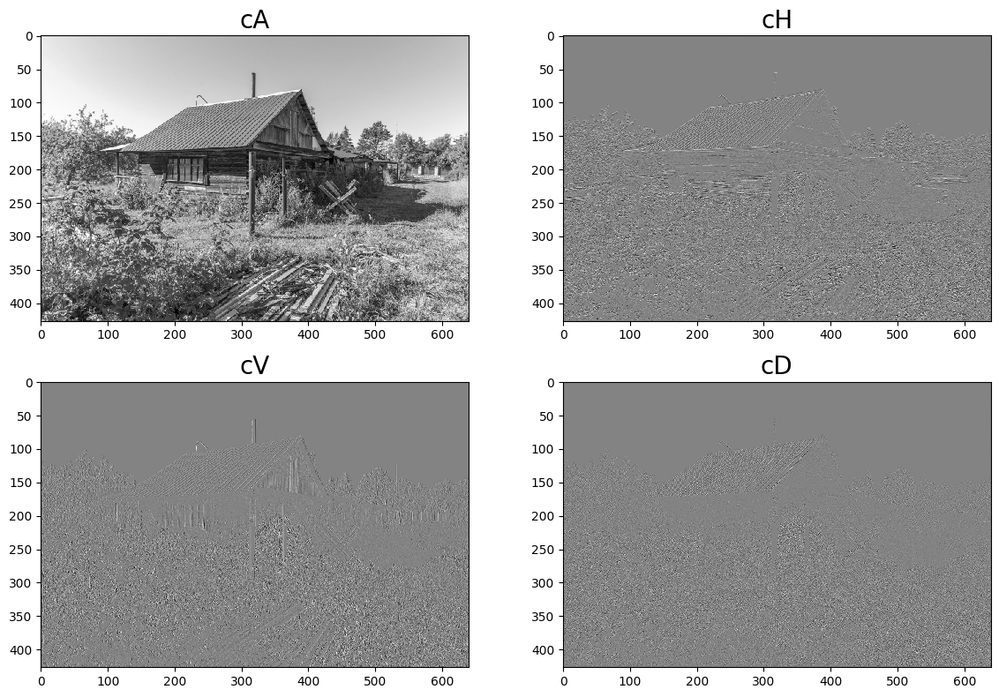

In [125]:
titles = ['cA', 'cH', 'cV', 'cD']
fig = plt.figure(figsize=(12, 8))
for i, a in enumerate([cA, cH, cV, cD]):
    ax = fig.add_subplot(2, 2, i + 1)
    a_norm = (a - np.min(a)) / (np.max(a) - np.min(a)) * 255
    ax.imshow(a_norm, interpolation="nearest", cmap = 'gray')
    ax.set_title(titles[i], fontsize=20)
fig.tight_layout()
plt.show()

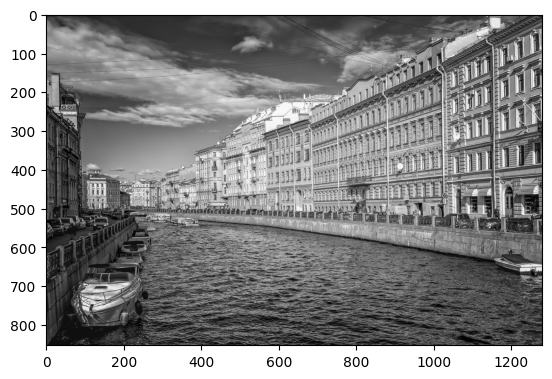

In [126]:
img_path = "data/ex5/st-petersburg-3714288_1280.jpg"

img = cv2.imread(img_path)
image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(image, cmap='gray');

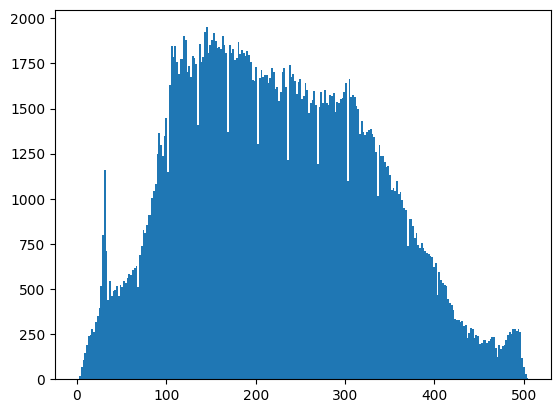

In [127]:
wavelet = 'haar'
c = pywt.dwt2(image,wavelet)
cA, (cH, cV, cD) = c

gray_hist = plt.hist(cA.ravel(), bins = 256)

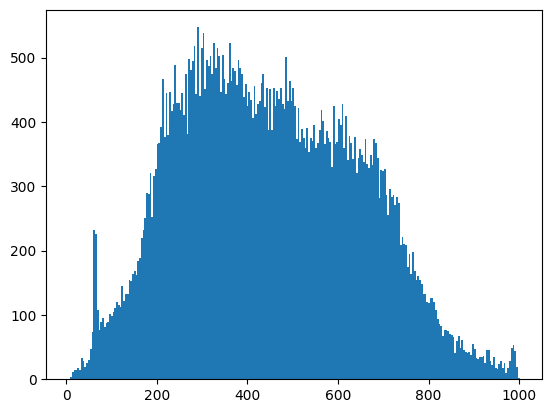

In [132]:
c2 = pywt.dwt2(cA, wavelet)
cA2, _ = c2

gray_hist = plt.hist(cA2.ravel(), bins = 256)

In [134]:
(np.abs(cA2) < 130).sum()

np.int64(2454)

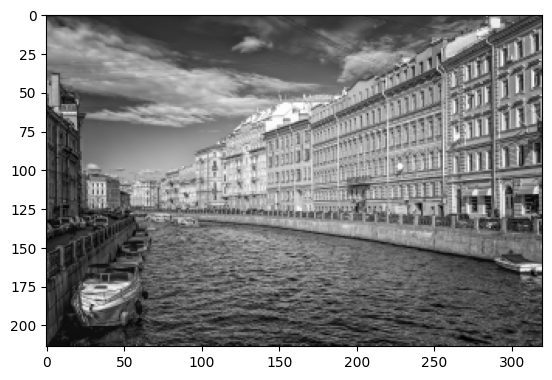

In [137]:
cA2_trunc = cA2.copy()
cA2_trunc[cA2_trunc < 130] = 0

plt.imshow(cA2, cmap='gray');

# Упражнение 6

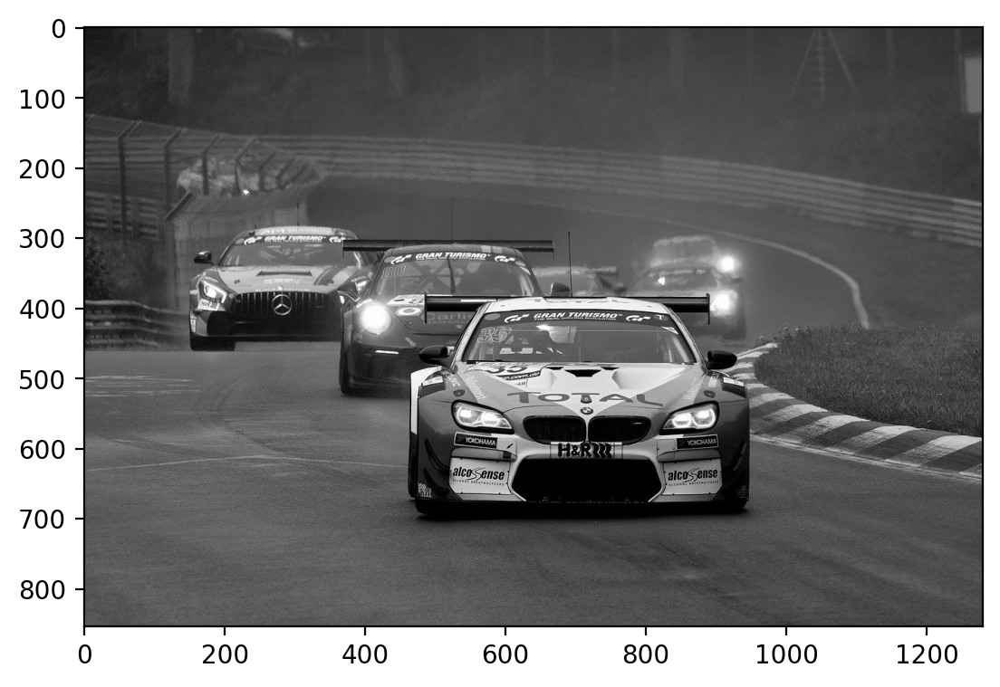

In [166]:
img_path = "data/ex6/car-racing-4394450_1280.jpg"

img_orig = cv2.imread(img_path)
img = cv2.cvtColor(img_orig, cv2.COLOR_BGR2GRAY)
# img = np.float32(img)

plt.imshow(img, cmap='gray');

(88, 75)


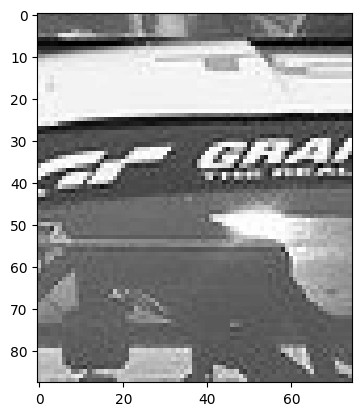

In [146]:
subimg = img[377:465, 602:677]

print(subimg.shape)

plt.imshow(subimg, cmap='gray')

In [154]:
sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(subimg, None)
kp2, des2 = sift.detectAndCompute(img, None)

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
#crossCheck=false - совпадения вида один ко многим, crossCheck=true - совпадения вида один к одному
matches = bf.match(des1, des2)

matches = sorted(matches, key = lambda x:x.distance)
print('Количество совпадений ', len(matches))
for i in range(len(matches)): #выведем первые 3
    print('Расстояние ', matches[i].distance, 'Индекс 1 ', matches[i].trainIdx, 'Индекс 2 ', matches[i].queryIdx)

Количество совпадений  45
Расстояние  0.0 Индекс 1  1015 Индекс 2  5
Расстояние  0.0 Индекс 1  1044 Индекс 2  8
Расстояние  0.0 Индекс 1  1046 Индекс 2  9
Расстояние  0.0 Индекс 1  1047 Индекс 2  10
Расстояние  0.0 Индекс 1  1055 Индекс 2  12
Расстояние  0.0 Индекс 1  1076 Индекс 2  17
Расстояние  0.0 Индекс 1  1077 Индекс 2  18
Расстояние  0.0 Индекс 1  1080 Индекс 2  19
Расстояние  0.0 Индекс 1  1089 Индекс 2  20
Расстояние  0.0 Индекс 1  1092 Индекс 2  21
Расстояние  0.0 Индекс 1  1094 Индекс 2  22
Расстояние  0.0 Индекс 1  1096 Индекс 2  24
Расстояние  0.0 Индекс 1  1100 Индекс 2  27
Расстояние  0.0 Индекс 1  1102 Индекс 2  29
Расстояние  0.0 Индекс 1  1110 Индекс 2  33
Расстояние  0.0 Индекс 1  1111 Индекс 2  34
Расстояние  0.0 Индекс 1  1116 Индекс 2  37
Расстояние  0.0 Индекс 1  1121 Индекс 2  39
Расстояние  0.0 Индекс 1  1125 Индекс 2  41
Расстояние  2.0 Индекс 1  1054 Индекс 2  11
Расстояние  3.0 Индекс 1  1023 Индекс 2  6
Расстояние  8.0 Индекс 1  1064 Индекс 2  14
Расстояние

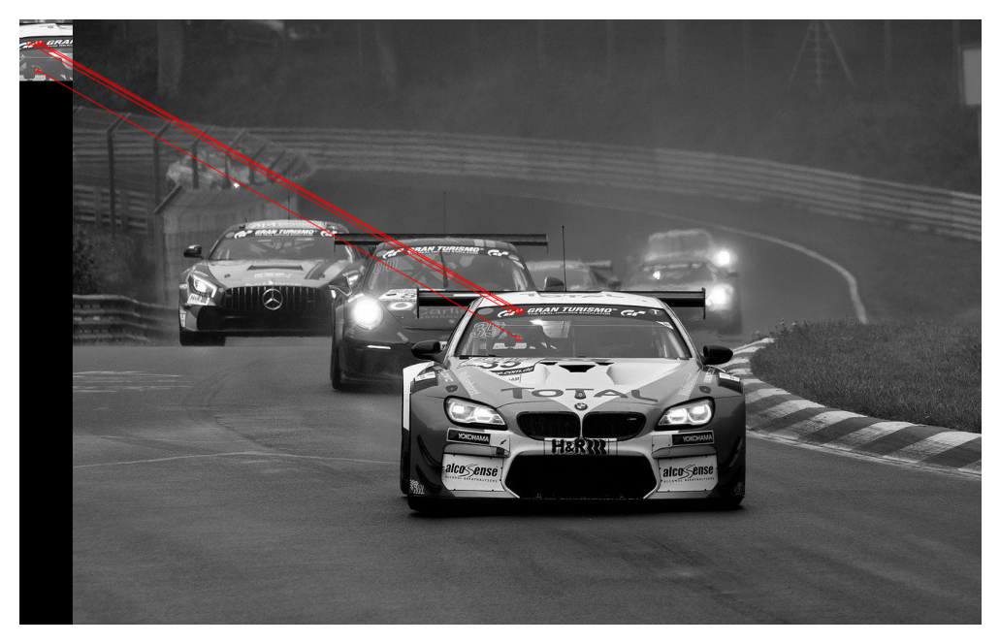

In [155]:
matching_result = cv2.drawMatches(subimg, kp1, img, kp2, matches[:5], None, [255,0,0], flags=2)
mpl.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(matching_result)

In [168]:
x, y = kp2[matches[0].trainIdx].pt
print(int(x), int(y))
print(img_orig[int(y), int(x)])

615 411
[255 247 250]


# Упражнение 7

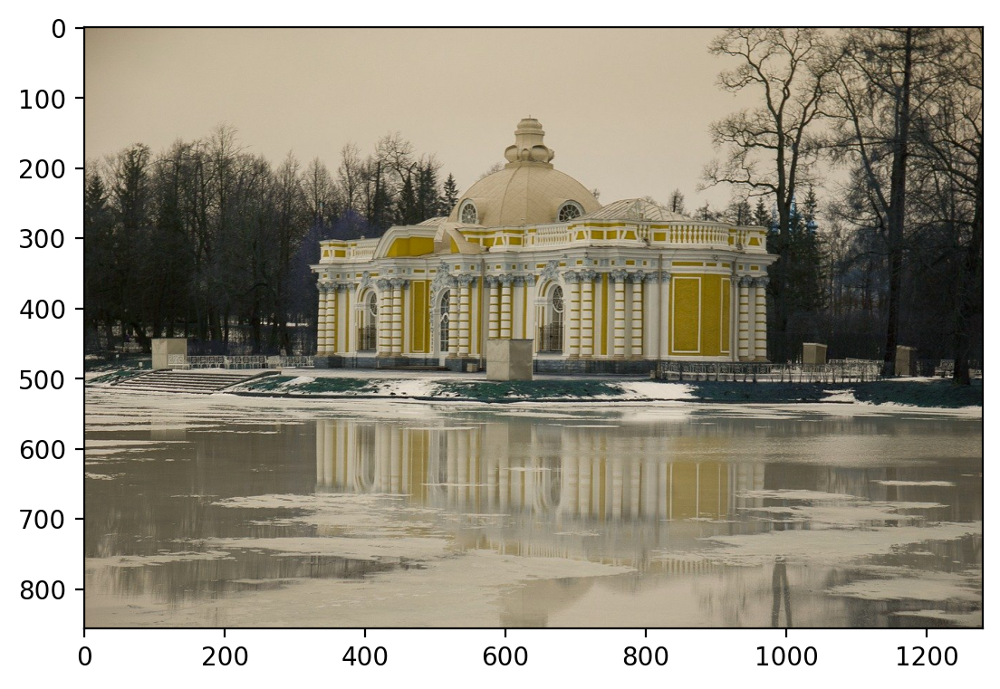

In [169]:
img_path = "data/ex7/russia-1927758_1280.jpg"

img = cv2.imread(img_path)
plt.imshow(img)

In [170]:
print(img.shape)
print(np.mean(img))

(856, 1280, 3)
121.34244974201714


98.56171966267523
141.30664366725077


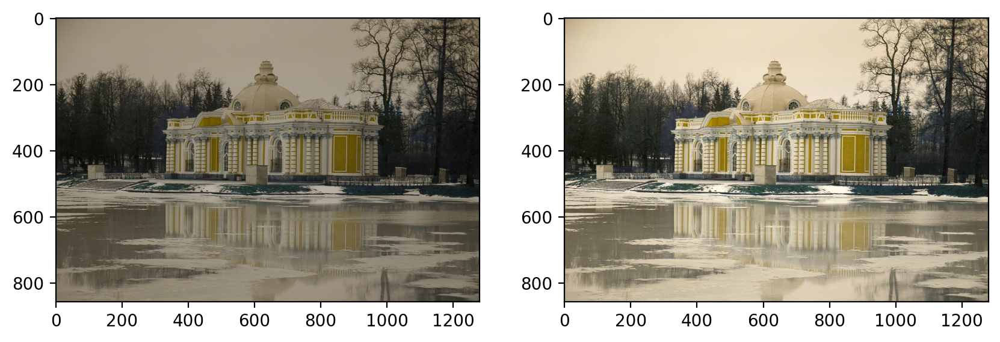

In [171]:
def exposure(image, p):
    img_result = np.round(image.copy() * (2 ** p),0)
    img_result = img_result.astype(int)
    img_result[img_result > 255] = 255
    return img_result

img_result = exposure(img, -0.3)
print(np.mean(img_result))

img_result2 = exposure(img, 0.22)
print(np.mean(img_result2))

_, axs = plt.subplots(1, 2, figsize=(10, 16))
axs[0].imshow(img_result)
axs[1].imshow(img_result2)

26.956039780471183
26.585137388045172


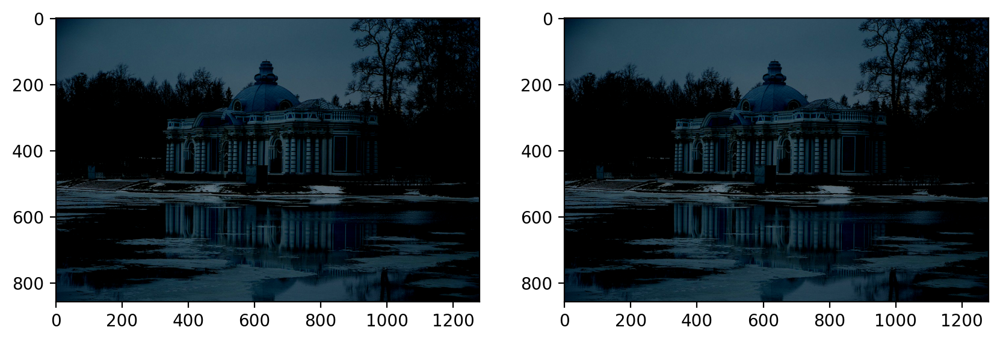

In [180]:
def contrast(image, p):
    image = image / 255.
    if p > 0:
        image = (image - 0.5) / (1 - p) # + 0.5
    else:
        image = (image - 0.5) * (1 - p) # + 0.5
    image = np.round(np.clip(image, 0, 1) * 255).astype(np.uint8)
    return image

img_result = contrast(img, -0.3)
print(np.mean(img_result))

img_result2 = contrast(img, 0.22)
print(np.mean(img_result2))

_, axs = plt.subplots(1, 2, figsize=(10, 16))
axs[0].imshow(img_result[:, :, ::-1])
axs[1].imshow(img_result2[:, :, ::-1])

# Упражнение 8

In [184]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K

img_width, img_height = 150, 150 # ширина, высота изображений

if K.image_data_format() == 'channels_first': # для сохранения упорядочевания весов при переключении модели с одного формата данных на другой
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape)) # добавляем сверточный 2D-слой. Поскольку это 1-ый слой, необходимо задать ключевой аргумент input_shape
# 32 - количество выходных фильтров в свертке, т.е. сколько признаков будем искать
# (3, 3) - kernel_size-высота и ширина окна 2D свертки
# Имеется 32 фильтра, каждый 3x3x3 (т. е. 27 весов), плюс 1 для смещения (т. е. всего 28 весов каждый). 32 фильтра * 28 весов = 896 параметров.
model.add(Activation('relu')) # указываем функцию активации. В данном случае f(z)=max(0,z)
model.add(MaxPooling2D(pool_size=(2, 2))) # уменьшим размер исходной матрицы (этот слой обязателен после сверточных слоев)

model.add(Conv2D(32, (3, 3))) # добавляем второй сверточный слой
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3))) # добавляем третий сверточный слой (размер фильтра увеличивается, так что сеть уже может изучать более сложные представления)
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten()) # слой, преобразующий 2D-данные в 1D-данные
model.add(Dense(64)) # добавляем полносвязный слой с указанием числа выходов
model.add(Activation('relu'))
model.add(Dropout(0.5)) # добавляем слой, обнуляющий в модели часть весов, чтоб избежать переобучения (0,5 означает, что он отбрасывает 50% существующих соединений)
model.add(Dense(1))
model.add(Activation('sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])


ModuleNotFoundError: No module named 'tensorflow'

In [1]:
import cv2
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

In [186]:
%pip install opencv-contrib-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.0/52.0 MB 11.6 MB/s  0:00:04 eta 0:00:01

[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: /opt/homebrew/opt/python@3.10/bin/python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


# Экзамен пробник

In [ ]:
%pip install PyWavelets

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pywt
import cv2

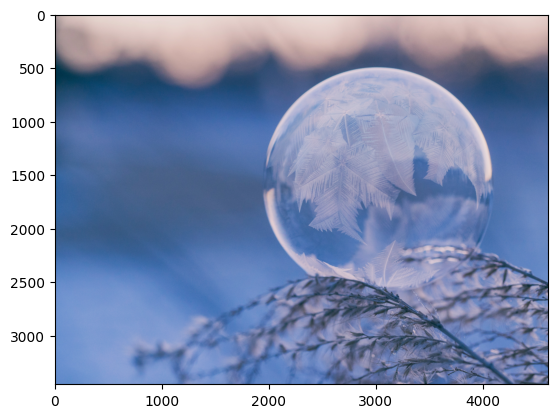

In [3]:
img_path = "data/exam-test/aaron-burden-xtIYGB0KEqc-unsplash.jpg"

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)

1.3333333333333333
1728


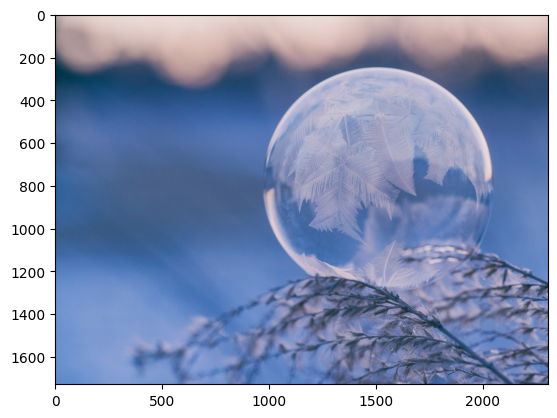

In [4]:
target_width = 2304
target_height = int(target_width / img.shape[1] * img.shape[0])
print(img.shape[1] / img.shape[0])
print(target_height)

img_resz = cv2.resize(img, (target_width, target_height), interpolation = cv2.INTER_AREA)
plt.imshow(img_resz)

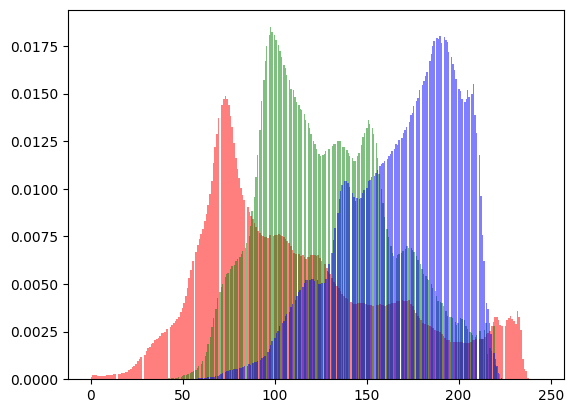

In [5]:
hist_r = plt.hist(img_resz[:, :, 0].ravel(), bins = 256, color = 'Red', alpha = 0.5, density=True)
hist_g = plt.hist(img_resz[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5, density=True)
hist_b = plt.hist(img_resz[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5, density=True)

plt.show()

In [6]:
print("Max density:", round(max(hist_r[0].max(), hist_g[0].max(), hist_b[0].max()), 4))

Max density: 0.0185


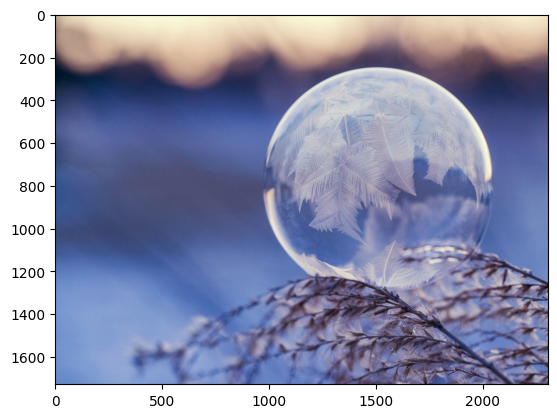

In [7]:
def linear_normalize_channel(channel):
    """Линейная нормировка канала на диапазон [0, 255]"""
    min_val = np.min(channel)
    max_val = np.max(channel)
    if max_val == min_val:
        # Если канал постоянный, устанавливаем все значения в 0 (или 128)
        return np.zeros_like(channel, dtype=np.uint8)
    # Нормализация и приведение к uint8
    normalized = (channel - min_val) * (255.0 / (max_val - min_val))
    return normalized.astype(np.uint8)

r, g, b = cv2.split(img_resz)

r_norm = linear_normalize_channel(r)
g_norm = linear_normalize_channel(g)
b_norm = linear_normalize_channel(b)

img_norm = cv2.merge([r_norm, g_norm, b_norm])

plt.imshow(img_norm)

In [8]:
row, col = 891, 1146
img_norm[row, col]

array([152, 157, 184], dtype=uint8)

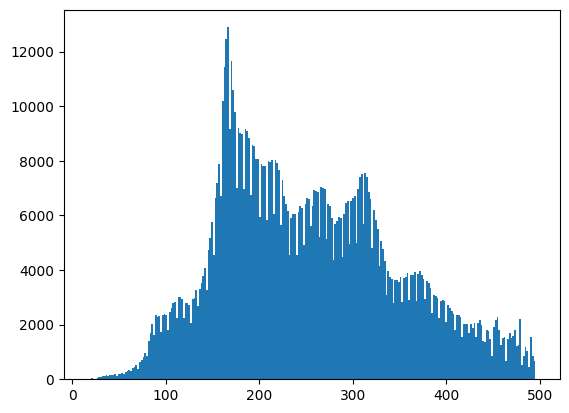

In [11]:
gray = cv2.cvtColor(img_norm, cv2.COLOR_RGB2GRAY)

cA, (cH, cV, cD) = pywt.dwt2(gray, 'haar')

gray_hist = plt.hist(cA.ravel(), bins = 256)

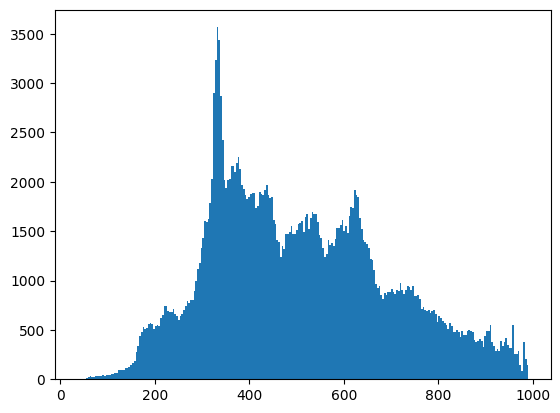

In [12]:
cA2, _ = pywt.dwt2(cA, 'haar')
gray_hist = plt.hist(cA2.ravel(), bins = 256)

286


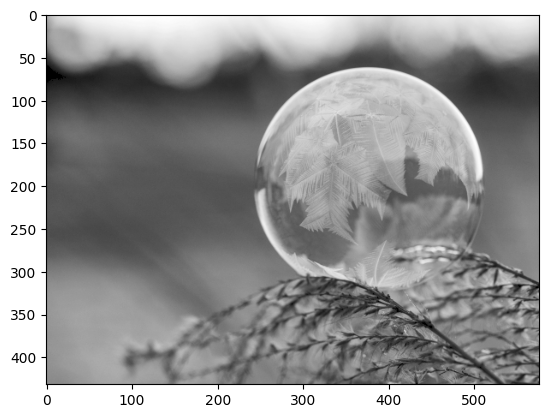

In [13]:
threshold = 90
mask = np.abs(cA2) < threshold
print(mask.sum())
cA2[mask] = 0

plt.imshow(cA2, 'gray')